In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Gloval environment

## Load data

In [5]:
os.listdir("../../")

['.git',
 '.gitignore',
 'data',
 'docker',
 'Dockerfile',
 'Enrichment analysis',
 'Layer markers',
 'preprocess',
 'QC',
 'requirements.txt',
 'Specie-specific genes',
 'venv']

In [ ]:
os.listdir('../../data/anndata_objects/human')

In [ ]:
adata = sc.read_h5ad('../../data/anndata_objects/human/human.h5ad')
adata.obs_names_make_unique()
adata

C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils/qc_utils.py.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 17633 × 19966
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types'
    uns: 'spatial'
    obsm: 'spatial'

Filter spots with no annotation

In [ ]:
adata = adata[adata.obs.label.notna()]

In [ ]:
adata.obs.label.value_counts()

WM             5004
L3             3118
L5             1951
L4             1869
Empty spots    1411
L1             1389
L6             1167
L2             1075
L6b             339
L6a             309
Name: label, dtype: int64

In [ ]:
samples = list(adata.uns['spatial'].keys())
samples

['human_759', 'human_j12', 'human_j3', 'human_j4', 'human_j6']

## Look at images

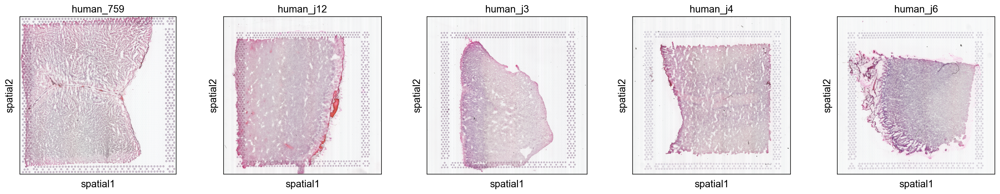

In [ ]:
sq.pl.spatial_scatter(adata, library_key='sample_id', title=samples, ncols=5)

## Check metrics

In [ ]:
# add info on mitochondrial and hemoglobin genes to the objects.
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

C:\Users\aleks\AppData\Local\Temp\ipykernel_7872\691799978.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('MT-')


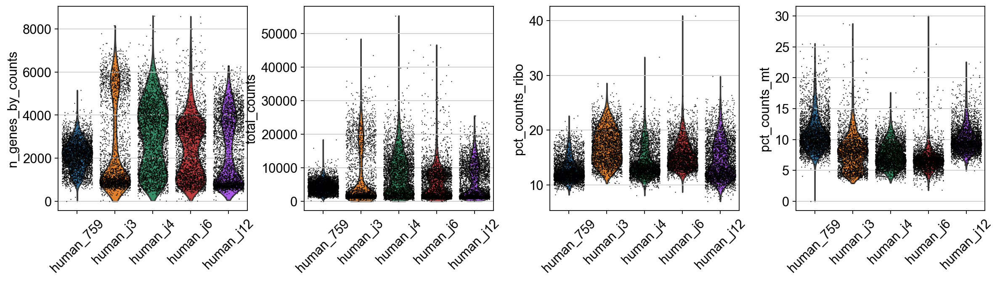

In [ ]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt'],
             jitter=0.4, groupby = 'sample_id', rotation= 45)

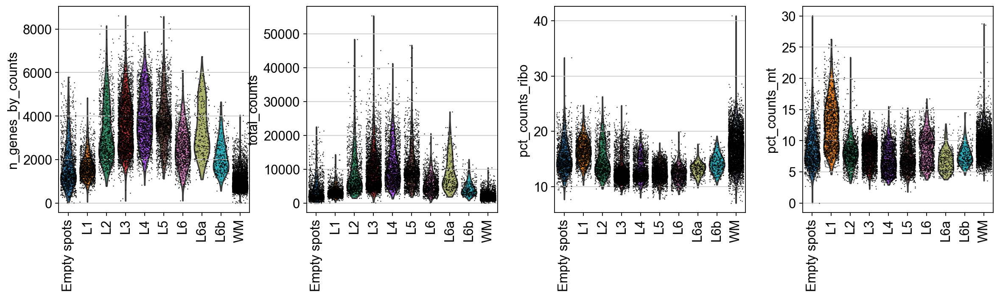

In [ ]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt'],
             jitter=0.4, groupby = 'label', rotation= 90)

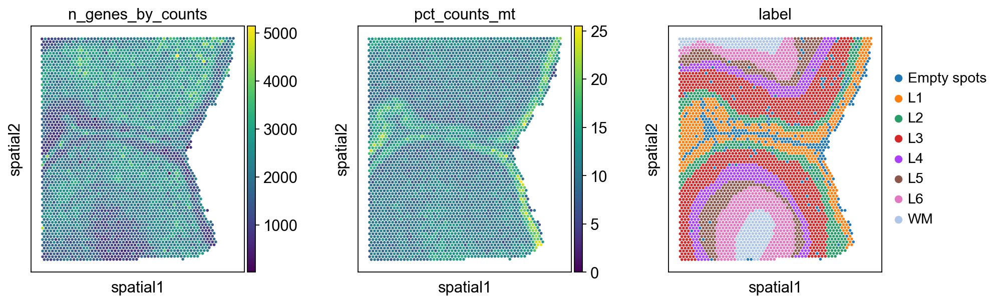

In [ ]:
sq.pl.spatial_scatter(adata,
                      color=['n_genes_by_counts', 'pct_counts_mt', 'label'],
                      library_key='sample_id', ncols=3, img=False, size=1.3, library_id='human_759')

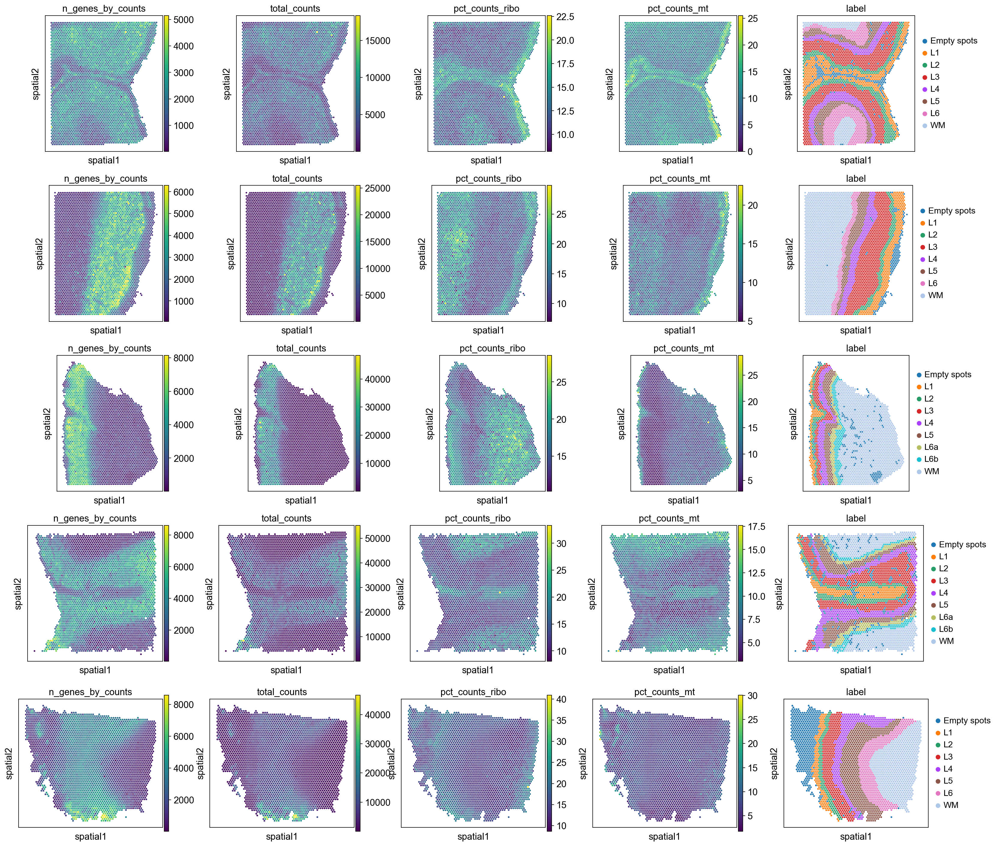

In [ ]:
sq.pl.spatial_scatter(adata,
                      color=['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'label'],
                      library_key='sample_id', ncols=5, img=False, size=1.3)

## PCA

In [ ]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [ ]:
sc.pp.highly_variable_genes(
    adata=adata, flavor="seurat", 
    n_top_genes=3000, inplace=True,
    batch_key="sample_id")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [ ]:
sc.tl.pca(adata, use_highly_variable=False)

computing PCA
    with n_comps=50
    finished (0:02:25)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


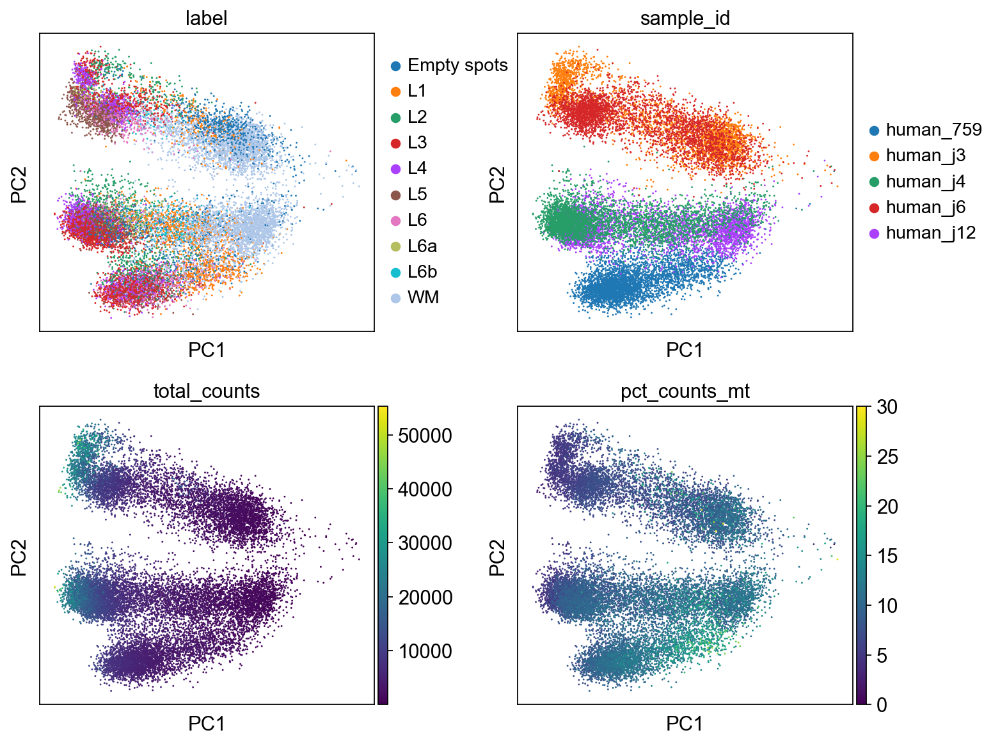

In [ ]:
sc.pl.pca(adata, 
          color=['label', 'sample_id', 'total_counts','pct_counts_mt'],
          ncols=2, show=True, wspace=0.3)

C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8942 (\N{VERTICAL ELLIPSIS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


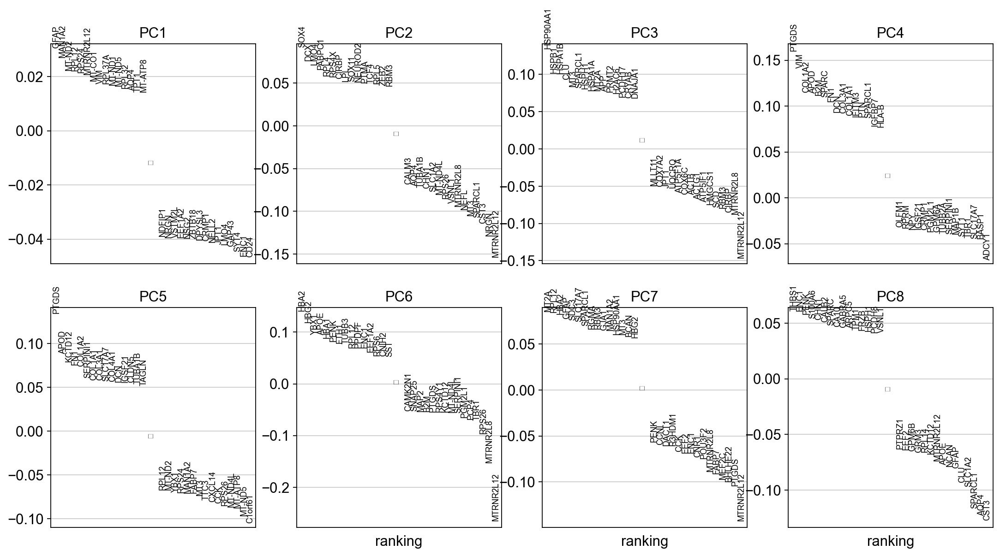

In [ ]:
sc.pl.pca_loadings(adata, components=[1,2])